In [ ]:
import pandas as pd
from pathlib import Path

# -----------------------------------------------------------------------------
# Robust project-root + data-path resolution (works from repo root or notebooks/)
# -----------------------------------------------------------------------------
PROJECT_ROOT = Path.cwd()
if not (PROJECT_ROOT / "data").exists() and (PROJECT_ROOT.parent / "data").exists():
    PROJECT_ROOT = PROJECT_ROOT.parent
DATA_DIR = PROJECT_ROOT / "data"

# -----------------------------------------------------------------------------
# Load dataset
# - Prefer raw `sentencing.csv` if present.
# - Fall back to committed `cleaned_data_phase2.csv` for a runnable repo checkout.
# -----------------------------------------------------------------------------
raw_path = DATA_DIR / "sentencing.csv"
phase2_path = DATA_DIR / "cleaned_data_phase2.csv"

if raw_path.exists():
    ussc_df = pd.read_csv(raw_path, low_memory=False)
    print(f"Loaded raw dataset: {raw_path} | shape={ussc_df.shape}")
else:
    ussc_df = pd.read_csv(phase2_path, low_memory=False)
    print(f"Loaded fallback dataset: {phase2_path} | shape={ussc_df.shape}")

# -----------------------------------------------------------------------------
# Optional normalization: update NEWRACE from MONRACE if MONRACE exists
# -----------------------------------------------------------------------------
if "MONRACE" in ussc_df.columns and "NEWRACE" in ussc_df.columns:
    specific_monraces = {
        "American Indian or Alaskan Native": "American Indian or Alaskan Native",
        "Asian or Pacific Islander": "Asian or Pacific Islander",
    }
    for monrace, newrace in specific_monraces.items():
        ussc_df.loc[ussc_df["MONRACE"] == monrace, "NEWRACE"] = newrace

# Ensure SENTTOT numeric if present
if "SENTTOT" in ussc_df.columns:
    ussc_df["SENTTOT"] = pd.to_numeric(ussc_df["SENTTOT"], errors="coerce")

# -----------------------------------------------------------------------------
# Select relevant features (only keep those that exist in the loaded dataset)
# -----------------------------------------------------------------------------
selected_features = [
    "AGE",
    "NEWRACE",
    "MONSEX",
    "EDUCATN",
    "DISTRICT",
    "CIRCDIST",
    "CRIMHIST",
    "SENTYR",
    "CITIZEN",
    "CITWHERE",
    "NUMDEPEN",
    "CRIMLIV",
    "SENTMON",
    "ZONE",
    "DISPOSIT",
    "SENTTOT",
]
selected_features = [c for c in selected_features if c in ussc_df.columns]

X = ussc_df[selected_features].copy()
print("Selected columns:", selected_features)
if "SENTTOT" in X.columns:
    print("SENTTOT describe:\n", X["SENTTOT"].describe())

# -----------------------------------------------------------------------------
# Encoding note:
# We do NOT one-hot encode numeric `SENTTOT` (that creates thousands of columns).
# This notebook is EDA + phase2 export; full encoding happens in Notebook 3.
# -----------------------------------------------------------------------------
cat_cols = [c for c in [
    "NEWRACE",
    "MONSEX",
    "EDUCATN",
    "DISTRICT",
    "CIRCDIST",
    "CRIMHIST",
    "SENTYR",
    "CITIZEN",
    "CITWHERE",
    "CRIMLIV",
    "ZONE",
    "DISPOSIT",
    "SENTMON",
] if c in X.columns]

X_encoded = pd.get_dummies(X, columns=cat_cols, drop_first=True)
print("Encoded feature matrix shape:", X_encoded.shape)
print(X.head(3))

# Proceed with exploratory analysis (e.g., correlation, visualization)


/var/folders/3q/y3lhffxj6dl1rxzx2yw0441m0000gn/T/ipykernel_84447/570212508.py:5: DtypeWarning:

Columns (18,25,26,29,68,69,70,71,72,73,74,75,76,77,79,80,106,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,130,131,132,133,134,135,136,137,138,139,140,141,142,149,150,151,152,153,154,155,156,157,158,159,160,161,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,237,240,241,314,334,346,347,351,352,353,357,358,363,364,369,375,380,392,396,403,404,416,434,454,455,456,457,458,459,460,461,462,463,464,465,470,494,495,496,497,498,499,500,501,502,503,504,505,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,532,544,545,547,549,551,553,562,563) have mixed types. Specify dtype option on import or set low_memory=False.



(76538, 574)
count    70098.000000
mean        45.653254
std         71.585642
min          0.030000
25%          5.850000
50%         21.000000
75%         60.000000
max       5040.000000
Name: SENTTOT, dtype: float64
Selected Features: ['AGE', 'NUMDEPEN', 'SENTMON', 'NEWRACE_Asian or Pacific Islander', 'NEWRACE_Black', 'NEWRACE_Hispanic', 'NEWRACE_Other', 'NEWRACE_White', 'MONSEX_Male', 'EDUCATN_College graduate', 'EDUCATN_Eight years of school completed', 'EDUCATN_Eleven years of school completed', 'EDUCATN_Five years of school completed', 'EDUCATN_Four years of school completed', 'EDUCATN_G.E.D. (general education diploma)', 'EDUCATN_Graduate degree (MST, J.D., M.D., PH.D., etc)', 'EDUCATN_High school graduate', 'EDUCATN_Middle school / junior high', 'EDUCATN_Military training', 'EDUCATN_Nine years of school completed', 'EDUCATN_No schooling', 'EDUCATN_One year of college / freshman', 'EDUCATN_One year of school completed', 'EDUCATN_Seven years of school completed', 'EDUCATN_Six ye

In [37]:
print(X['NEWRACE'].unique())
print(X['NEWRACE'].value_counts())
print(X['NEWRACE'].isna().sum())
print(X['SENTTOT'].unique())
print(X['SENTTOT'].value_counts())
print(X['SENTTOT'].isna().sum())

['Hispanic' 'White' 'Black' 'Other' 'American Indian or Alaskan Native'
 'Asian or Pacific Islander' nan]
NEWRACE
Hispanic                             42492
Black                                15326
White                                15033
American Indian or Alaskan Native     1552
Asian or Pacific Islander             1119
Other                                  207
Name: count, dtype: int64
809
[ 30.     2.03  18.   ... 354.   358.    28.13]
SENTTOT
0.03      4144
24.00     2826
60.00     2593
12.03     2346
18.00     2266
          ... 
41.89        1
71.49        1
26.62        1
180.16       1
28.13        1
Name: count, Length: 1406, dtype: int64
6440


In [38]:
missing_counts = X.isna().sum().sort_values(ascending=False)
print("Top 10 features with most missing values:")
print(missing_counts.head(10))

Top 10 features with most missing values:
NUMDEPEN    8488
EDUCATN     8471
SENTTOT     6440
CRIMLIV     5088
CRIMHIST    2020
CITWHERE    1383
ZONE        1156
NEWRACE      809
CITIZEN      428
MONSEX       111
dtype: int64


In [39]:
# print("Basic Descriptive Statistics:")
print(X.describe(include='all'))
X["NEWRACE"].describe()

                 AGE   NEWRACE MONSEX               EDUCATN    DISTRICT  \
count   76485.000000     75729  76427                 68067       76538   
unique           NaN         6      2                    28          94   
top              NaN  Hispanic   Male  High school graduate  Texas West   
freq             NaN     42492  67037                 11797        9769   
mean       36.381147       NaN    NaN                   NaN         NaN   
std        10.935522       NaN    NaN                   NaN         NaN   
min        16.000000       NaN    NaN                   NaN         NaN   
25%        28.000000       NaN    NaN                   NaN         NaN   
50%        35.000000       NaN    NaN                   NaN         NaN   
75%        43.000000       NaN    NaN                   NaN         NaN   
max        86.000000       NaN    NaN                   NaN         NaN   

          CIRCDIST                          CRIMHIST        SENTYR  \
count        76538           

count        75729
unique           6
top       Hispanic
freq         42492
Name: NEWRACE, dtype: object

In [40]:
print(X["SENTTOT"].describe())
print(X["SENTTOT"].value_counts())
count = (X['SENTTOT'] == 5040).sum()
print("Count for 5040: ", count)
greater_than_1000 = X[X['SENTTOT'] > 1000]['SENTTOT']
print("Greater than 1000: ", greater_than_1000)

# Get value counts for SENTTOT
value_counts = X['SENTTOT'].value_counts()

# Filter for values with count equal to 1
values_with_count_one = value_counts[value_counts > 1].index

# Display these values
print("Values with count one: ", values_with_count_one)

print(X["SENTTOT"].unique())
print(X["SENTTOT"].head(10))

count    70098.000000
mean        45.653254
std         71.585642
min          0.030000
25%          5.850000
50%         21.000000
75%         60.000000
max       5040.000000
Name: SENTTOT, dtype: float64
SENTTOT
0.03      4144
24.00     2826
60.00     2593
12.03     2346
18.00     2266
          ... 
41.89        1
71.49        1
26.62        1
180.16       1
28.13        1
Name: count, Length: 1406, dtype: int64
Count for 5040:  1
Greater than 1000:  798      1750.00
1122     1359.85
1949     1276.00
5411     1740.00
9854     1080.00
13026    1680.00
16320    1440.00
18815    1080.00
27284    5040.00
32845    3120.00
41762    2160.00
42334    1680.00
43517    1080.00
47590    1440.00
52337    2160.00
61631    1013.00
63361    1200.00
67850    3240.00
Name: SENTTOT, dtype: float64
Values with count one:  Index([ 0.03,  24.0,  60.0, 12.03,  18.0, 120.0,   6.0,  30.0,  15.0,   8.0,
       ...
       27.13, 278.0, 14.39, 10.03, 20.03, 460.0, 10.02, 19.82, 13.59, 15.03],
      dtype='flo

<Figure size 1000x600 with 0 Axes>

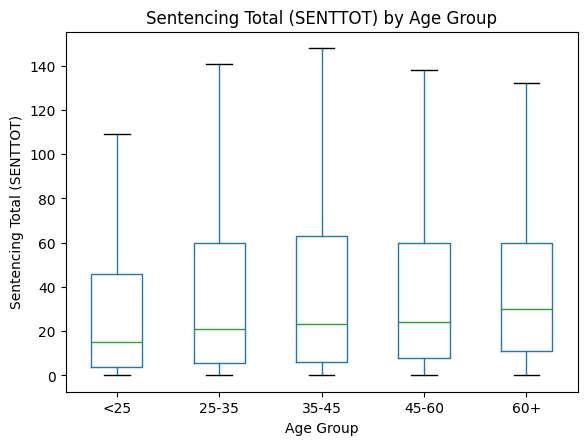

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Create age bins
age_bins = [0, 25, 35, 45, 60, 100]
age_labels = ['<25', '25-35', '35-45', '45-60', '60+']
ussc_df['AGE_BIN'] = pd.cut(ussc_df['AGE'], bins=age_bins, labels=age_labels, include_lowest=True)

# Box plot of SENTTOT by age bins
plt.figure(figsize=(10, 6))
ussc_df.boxplot(column='SENTTOT', by='AGE_BIN', grid=False, showfliers=False)
plt.title('Sentencing Total (SENTTOT) by Age Group')
plt.suptitle('')  # Remove default suptitle from pandas boxplot
plt.xlabel('Age Group')
plt.ylabel('Sentencing Total (SENTTOT)')
plt.show()



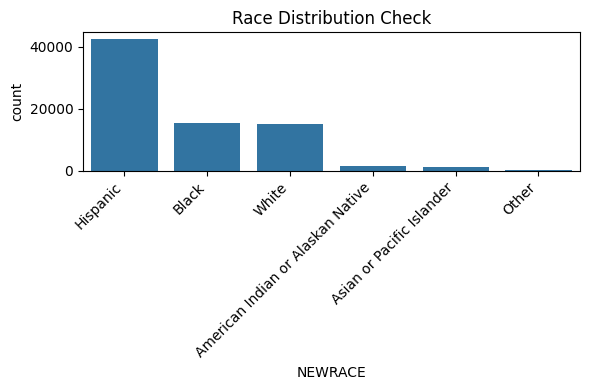

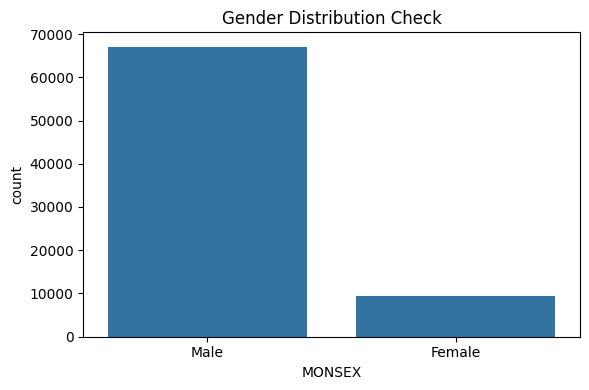

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sort 'NEWRACE' by count
race_order = X['NEWRACE'].value_counts().index

plt.figure(figsize=(6, 4))
sns.countplot(x='NEWRACE', data=X, order=race_order)
plt.title('Race Distribution Check')
plt.xticks(rotation=45, ha='right')  # Align labels properly
plt.tight_layout()
plt.show()


plt.figure(figsize=(6,4))
sns.countplot(x='MONSEX', data=X)
plt.title('Gender Distribution Check')
plt.tight_layout()
plt.show()

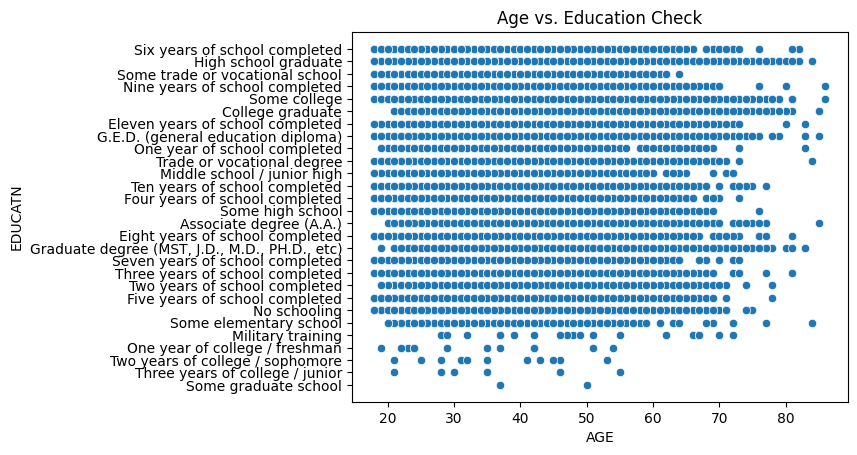

In [43]:
import plotly.express as px

# Simple Scatter Plot
sns.scatterplot(data=X, x='AGE', y='EDUCATN')
plt.title('Age vs. Education Check')
plt.show()

# Interactive Scatter Plot
fig = px.scatter(
    X,
    x='AGE',
    y='EDUCATN',
    color='NEWRACE',
    hover_data=['CITIZEN', 'DISTRICT'],  # Add additional details
    title='Age vs. Education Check'
)
fig.update_traces(marker=dict(size=6, opacity=0.7))  # Adjust marker size and opacity
fig.show()


In [ ]:
# Export Phase 2 dataset to the repo `data/` directory
out_path = DATA_DIR / "cleaned_data_phase2.csv"
X.to_csv(out_path, index=False)
print(f"Wrote: {out_path} | shape={X.shape}")